In [5]:
# read in the data 
import pandas as pd
rivers = pd.read_csv('../../data/outputs/master_dataset_inputed.csv')
rivers_original = rivers.copy()

# sanity check 
print(rivers.head())
print(rivers.info())
print(rivers.describe())


rivers["date"] = pd.to_datetime(rivers[["year", "month"]].assign(day=1))
rivers_original["date"] = pd.to_datetime(rivers_original[["year", "month"]].assign(day=1))

rivers = rivers.sort_values("date").set_index("date")
rivers_original = rivers_original.sort_values("date").set_index("date")

rivers.groupby("river")["water_level"].std()

     river        date  year  month  water_level  runoff  temp_max_observed  \
0  Buzimba  1981-01-01  1981      1     0.541000   16.94          26.619355   
1  Buzimba  1981-02-01  1981      2     0.485000   15.35          26.696429   
2  Buzimba  1981-03-01  1981      3     0.548387   17.96          26.087097   
3  Buzimba  1981-04-01  1981      4     0.648000   13.90          26.093333   
4  Buzimba  1981-05-01  1981      5     0.594194   10.83          25.896774   

   temp_min_observed  precip_observed        temp_source  ... era5_v10_mean  \
0           17.38424       154.966725  NYANZA LAC (IRAT)  ...      0.862369   
1           17.38900       120.119005  NYANZA LAC (IRAT)  ...      0.571162   
2           18.16450       126.911998  NYANZA LAC (IRAT)  ...      0.580950   
3           18.14420       117.792010  NYANZA LAC (IRAT)  ...      0.503440   
4           17.22097       117.313940  NYANZA LAC (IRAT)  ...      0.361469   

  era5_d2m_mean  era5_msl_mean  temp_max_imputed  

river
Buzimba       0.442345
Jiji          0.236373
Kaburantwa    0.684697
Mpanda        0.302602
Mulembwe      0.666540
Mutimbuzi     0.655716
Nyakagunda    0.087199
Nyamagana     0.267380
Nyengwe       0.385688
Rusizi        1.049724
Name: water_level, dtype: float64

In [6]:
# ============================================================
# MULTI-MODEL WATER LEVEL IMPUTATION PIPELINE
# Models:
# 1. LightGBM
# 2. XGBoost
# 3. ARIMAX with predictors
# 4. SARIMAX with predictors
# ============================================================

import numpy as np
import pandas as pd

from lightgbm import LGBMRegressor
from xgboost import XGBRegressor

from statsmodels.tsa.statespace.sarimax import SARIMAX

from sklearn.impute import SimpleImputer
from sklearn.metrics import mean_squared_error, mean_absolute_error


# ============================================================
# SETTINGS
# ============================================================

TARGET_COL = "water_level"
RIVER_COL = "river"
START_YEAR = 2000

MASK_FRACTION = 0.20
RANDOM_SEED = 42
MIN_OBS = 50


# ============================================================
# FEATURE ENGINEERING
# ============================================================

def create_features(df, target_col=TARGET_COL):
    df = df.copy()
    df = df.sort_index()

    # Month seasonality
    df["month"] = df.index.month

    # Precipitation lags
    for lag in [1, 2, 3, 6, 12]:
        df[f"precip_lag{lag}"] = df["precip_observed"].shift(lag)

    # Rolling rainfall totals using previous months only
    df["precip_3m"] = df["precip_observed"].shift(1).rolling(3).sum()
    df["precip_6m"] = df["precip_observed"].shift(1).rolling(6).sum()
    df["precip_12m"] = df["precip_observed"].shift(1).rolling(12).sum()

    # Weighted rainfall from previous 3 months
    df["precip_weighted_3m"] = (
        df["precip_observed"].shift(1) * 0.5 +
        df["precip_observed"].shift(2) * 0.3 +
        df["precip_observed"].shift(3) * 0.2
    )

    # Temporary interpolation only for lag creation
    df["water_level_temp"] = (
        df[target_col]
        .interpolate(method="linear")
        .ffill()
        .bfill()
    )

    # Water-level lags
    for lag in [1, 2, 3, 6, 12]:
        df[f"level_lag{lag}"] = df["water_level_temp"].shift(lag)

    return df


# ============================================================
# PREDICTOR LIST
# ============================================================

predictors = [
    "temp_max_observed",
    "temp_min_observed",
    "precip_observed",
    "precip_lag1",
    "precip_lag2",
    "precip_lag3",
    "precip_lag6",
    "precip_lag12",
    "precip_3m",
    "precip_6m",
    "precip_12m",
    "precip_weighted_3m",
    "month",
    "ndvi",
    "level_lag1",
    "level_lag2",
    "level_lag3",
    "level_lag6",
    "level_lag12"
]


# ============================================================
# MACHINE LEARNING MODELS
# ============================================================

ml_models = {
    "LightGBM": LGBMRegressor(
        n_estimators=300,
        learning_rate=0.03,
        max_depth=3,
        num_leaves=8,
        min_child_samples=5,
        subsample=0.8,
        colsample_bytree=0.8,
        random_state=RANDOM_SEED,
        verbose=-1
    ),

    "XGBoost": XGBRegressor(
        n_estimators=300,
        learning_rate=0.03,
        max_depth=3,
        subsample=0.8,
        colsample_bytree=0.8,
        random_state=RANDOM_SEED,
        objective="reg:squarederror"
    )
}


# ============================================================
# METRIC FUNCTION
# ============================================================

def calculate_metrics(y_true, y_pred, train_y):
    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    mae = mean_absolute_error(y_true, y_pred)
    bias = np.mean(y_pred - y_true)
    nrmse = rmse / train_y.std() if train_y.std() != 0 else np.nan

    return rmse, mae, bias, nrmse


# ============================================================
# VALIDATION: ARTIFICIALLY MASK 20% OF OBSERVED VALUES
# ============================================================

validation_results = []
validation_predictions = []

np.random.seed(RANDOM_SEED)

for river_name in rivers[RIVER_COL].dropna().unique():

    df = rivers[rivers[RIVER_COL] == river_name].copy()
    df = df.sort_index()

    # Keep modern NDVI period
    df = df[df.index.year >= START_YEAR].copy()

    observed_idx = df[df[TARGET_COL].notna()].index

    if len(observed_idx) < MIN_OBS:
        print(f"Skipping {river_name}: not enough observed values.")
        continue

    # Artificially mask 20% of observed water levels
    masked_idx = np.random.choice(
        observed_idx,
        size=int(len(observed_idx) * MASK_FRACTION),
        replace=False
    )

    df_val = df.copy()

    true_values = df_val.loc[masked_idx, TARGET_COL].copy()
    df_val.loc[masked_idx, TARGET_COL] = np.nan

    # Create predictors after masking
    df_val = create_features(df_val, target_col=TARGET_COL)

    # Keep rows where predictors exist
    available_predictor_rows = df_val[predictors].notna().any(axis=1)

    train_df = df_val[
        df_val[TARGET_COL].notna() & available_predictor_rows
    ].copy()

    test_df = df_val.loc[masked_idx].copy()
    test_df = test_df[test_df[predictors].notna().any(axis=1)]

    if len(train_df) < MIN_OBS or len(test_df) == 0:
        print(f"Skipping {river_name}: insufficient train/test rows after feature creation.")
        continue

    y_train = train_df[TARGET_COL]
    X_train = train_df[predictors]
    X_test = test_df[predictors]
    y_test = true_values.loc[test_df.index]

    # Impute missing predictor values
    imputer = SimpleImputer(strategy="mean")
    X_train_imp = imputer.fit_transform(X_train)
    X_test_imp = imputer.transform(X_test)

    # --------------------------------------------------------
    # LightGBM and XGBoost validation
    # --------------------------------------------------------

    for model_name, model in ml_models.items():

        model.fit(X_train_imp, y_train)
        preds = model.predict(X_test_imp)

        rmse, mae, bias, nrmse = calculate_metrics(y_test, preds, y_train)

        validation_results.append({
            "river": river_name,
            "model": model_name,
            "n_train": len(train_df),
            "n_test_masked": len(test_df),
            "rmse": rmse,
            "mae": mae,
            "bias": bias,
            "nrmse": nrmse
        })

        validation_predictions.append(pd.DataFrame({
            "river": river_name,
            "model": model_name,
            "date": test_df.index,
            "true_water_level": y_test.values,
            "predicted_water_level": preds,
            "error": preds - y_test.values
        }))

    # --------------------------------------------------------
    # ARIMAX validation
    # ARIMAX = SARIMAX with exogenous predictors but no seasonal term
    # --------------------------------------------------------

    try:
        df_arimax = df_val.copy()
        df_arimax = df_arimax[df_arimax[predictors].notna().any(axis=1)].copy()

        y_arimax = df_arimax[TARGET_COL]
        X_arimax = df_arimax[predictors]

        arimax_imputer = SimpleImputer(strategy="mean")
        X_arimax_imp = arimax_imputer.fit_transform(X_arimax)

        arimax_model = SARIMAX(
            y_arimax,
            exog=X_arimax_imp,
            order=(1, 0, 1),
            seasonal_order=(0, 0, 0, 0),
            enforce_stationarity=False,
            enforce_invertibility=False
        )

        arimax_fit = arimax_model.fit(disp=False)

        arimax_pred_all = arimax_fit.predict(
            start=0,
            end=len(df_arimax) - 1,
            exog=X_arimax_imp
        )

        arimax_preds = pd.Series(
            arimax_pred_all,
            index=df_arimax.index
        ).loc[test_df.index]

        rmse, mae, bias, nrmse = calculate_metrics(y_test, arimax_preds, y_train)

        validation_results.append({
            "river": river_name,
            "model": "ARIMAX",
            "n_train": len(train_df),
            "n_test_masked": len(test_df),
            "rmse": rmse,
            "mae": mae,
            "bias": bias,
            "nrmse": nrmse
        })

        validation_predictions.append(pd.DataFrame({
            "river": river_name,
            "model": "ARIMAX",
            "date": test_df.index,
            "true_water_level": y_test.values,
            "predicted_water_level": arimax_preds.values,
            "error": arimax_preds.values - y_test.values
        }))

    except Exception as e:
        print(f"ARIMAX failed for {river_name}: {e}")

    # --------------------------------------------------------
    # SARIMAX validation
    # SARIMAX includes monthly seasonality
    # --------------------------------------------------------

    try:
        df_sarimax = df_val.copy()
        df_sarimax = df_sarimax[df_sarimax[predictors].notna().any(axis=1)].copy()

        y_sarimax = df_sarimax[TARGET_COL]
        X_sarimax = df_sarimax[predictors]

        sarimax_imputer = SimpleImputer(strategy="mean")
        X_sarimax_imp = sarimax_imputer.fit_transform(X_sarimax)

        sarimax_model = SARIMAX(
            y_sarimax,
            exog=X_sarimax_imp,
            order=(1, 0, 1),
            seasonal_order=(1, 0, 1, 12),
            enforce_stationarity=False,
            enforce_invertibility=False
        )

        sarimax_fit = sarimax_model.fit(disp=False)

        sarimax_pred_all = sarimax_fit.predict(
            start=0,
            end=len(df_sarimax) - 1,
            exog=X_sarimax_imp
        )

        sarimax_preds = pd.Series(
            sarimax_pred_all,
            index=df_sarimax.index
        ).loc[test_df.index]

        rmse, mae, bias, nrmse = calculate_metrics(y_test, sarimax_preds, y_train)

        validation_results.append({
            "river": river_name,
            "model": "SARIMAX",
            "n_train": len(train_df),
            "n_test_masked": len(test_df),
            "rmse": rmse,
            "mae": mae,
            "bias": bias,
            "nrmse": nrmse
        })

        validation_predictions.append(pd.DataFrame({
            "river": river_name,
            "model": "SARIMAX",
            "date": test_df.index,
            "true_water_level": y_test.values,
            "predicted_water_level": sarimax_preds.values,
            "error": sarimax_preds.values - y_test.values
        }))

    except Exception as e:
        print(f"SARIMAX failed for {river_name}: {e}")


# ============================================================
# MODEL COMPARISON TABLES
# ============================================================

validation_results_df = pd.DataFrame(validation_results)
validation_predictions_df = pd.concat(validation_predictions, ignore_index=True)

# Overall model comparison
model_comparison = (
    validation_results_df
    .groupby("model")
    .agg(
        mean_rmse=("rmse", "mean"),
        median_rmse=("rmse", "median"),
        mean_mae=("mae", "mean"),
        median_mae=("mae", "median"),
        mean_bias=("bias", "mean"),
        mean_nrmse=("nrmse", "mean"),
        median_nrmse=("nrmse", "median"),
        rivers_tested=("river", "nunique")
    )
    .reset_index()
    .sort_values("mean_nrmse")
)

# Best model per river
best_model_per_river = (
    validation_results_df
    .sort_values(["river", "nrmse"])
    .groupby("river")
    .first()
    .reset_index()
)

# Count how often each model wins
model_win_counts = (
    best_model_per_river["model"]
    .value_counts()
    .reset_index()
)

model_win_counts.columns = ["model", "number_of_rivers_best"]


print("Overall model comparison:")
display(model_comparison)

print("Best model per river:")
display(best_model_per_river)

print("Number of rivers where each model performed best:")
display(model_win_counts)


# ============================================================
# SELECT OVERALL BEST MODEL
# ============================================================

overall_best_model = model_comparison.iloc[0]["model"]

print(f"Overall best model based on mean NRMSE: {overall_best_model}")






/Library/Frameworks/Python.framework/Versions/3.14/lib/python3.14/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.14/lib/python3.14/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/Library/Frameworks/Python.framework/Versions/3.14/lib/python3.14/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/Library/Frameworks/Python.framework/Versions/3.14/lib/python3.14/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/Library/Frameworks/Python.framework/Versi

Overall model comparison:


/Library/Frameworks/Python.framework/Versions/3.14/lib/python3.14/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


,model,mean_rmse,median_rmse,mean_mae,median_mae,mean_bias,mean_nrmse,median_nrmse,rivers_tested
3,XGBoost,0.140737,0.103586,0.106375,0.078862,-0.026182,0.336707,0.302605,10
1,LightGBM,0.142426,0.114565,0.107141,0.082304,-0.022060,0.342894,0.337111,10
0,ARIMAX,0.148757,0.117044,0.112663,0.087983,-0.018572,0.362008,0.344921,10
2,SARIMAX,0.149282,0.116541,0.112886,0.085561,-0.020515,0.364032,0.341653,10


Best model per river:


,river,model,n_train,n_test_masked,rmse,mae,bias,nrmse
0,Buzimba,SARIMAX,107,26,0.116644,0.082641,-0.028723,0.226785
1,Jiji,XGBoost,239,59,0.102261,0.069487,-0.008013,0.442203
2,Kaburantwa,XGBoost,150,37,0.140754,0.114606,-0.010223,0.239740
3,Mpanda,XGBoost,137,34,0.096407,0.075604,-0.009093,0.314945
4,Mulembwe,ARIMAX,208,51,0.273904,0.219770,-0.005326,0.442561
5,Mutimbuzi,LightGBM,86,21,0.285994,0.233052,-0.166635,0.407404
6,Nyakagunda,LightGBM,113,28,0.057375,0.044742,0.002832,0.545253
7,Nyamagana,XGBoost,138,34,0.081702,0.052202,-0.017583,0.290265
8,Nyengwe,LightGBM,110,27,0.094843,0.063780,-0.002309,0.239951
9,Rusizi,XGBoost,155,38,0.104910,0.082121,-0.004718,0.131570


Number of rivers where each model performed best:


,model,number_of_rivers_best
0,XGBoost,5
1,LightGBM,3
2,SARIMAX,1
3,ARIMAX,1


Overall best model based on mean NRMSE: XGBoost


In [ ]:
rivers.head()

,river,year,month,water_level,runoff,temp_max_observed,temp_min_observed,precip_observed,temp_source,precip_source,...,era5_v10_mean,era5_d2m_mean,era5_msl_mean,temp_max_imputed,temp_min_imputed,precip_bias_factor,precip_imputed,ndvi,water_level_imputed_v2,wl_imputed_v2
date,,,,,,,,,,,,,,,,,,,,,
1981-01-01,Buzimba,1981,1,0.541000,16.94,26.619355,17.384240,154.966725,NYANZA LAC (IRAT),NYANZA LAC (IRAT),...,0.862369,17.834026,101288.167581,False,True,0.255013,True,NaN,0.541000,False
1981-01-01,Nyamagana,1981,1,0.549032,NaN,30.354839,18.038710,138.500000,MPARAMBO,MPARAMBO,...,0.607085,12.743936,101209.140181,False,False,2.186850,False,NaN,0.549032,False
1981-01-01,Nyengwe,1981,1,0.596129,13.55,26.619355,20.176480,158.824128,NYANZA LAC (IRAT),NYANZA LAC (IRAT),...,0.669341,18.981015,101215.545262,False,True,0.365854,True,NaN,0.596129,False
1981-01-01,Rusizi,1981,1,1.560000,NaN,29.148387,18.770968,73.500000,BUJUMBURA (Aeroport),BUJUMBURA (Aeroport),...,0.737239,14.708146,101196.988118,False,False,1.504363,False,NaN,1.560000,False
1981-01-01,Jiji,1981,1,0.748065,NaN,21.396774,10.119355,270.200000,MPOTA (Tora),MPOTA (Tora),...,0.444230,15.701011,101401.648401,False,False,0.746962,False,NaN,0.748065,False


In [7]:
# ============================================================
# FINAL IMPUTATION USING ALL MODELS 
# ============================================================

rivers_imputed = rivers.copy()

for model_name in ["LightGBM", "XGBoost", "ARIMAX", "SARIMAX"]:
    rivers_imputed[f"water_level_{model_name}_imputed"] = rivers_imputed[TARGET_COL]
    rivers_imputed[f"water_level_{model_name}_method"] = np.where(
        rivers_imputed[TARGET_COL].notna(),
        "observed",
        "missing"
    )


for river_name in rivers[RIVER_COL].dropna().unique():

    df = rivers[rivers[RIVER_COL] == river_name].copy()
    df = df.sort_index()
    df = df[df.index.year >= START_YEAR].copy()

    df_features = create_features(df, target_col=TARGET_COL)
    df_features = df_features[df_features[predictors].notna().any(axis=1)].copy()

    observed_df = df_features[df_features[TARGET_COL].notna()].copy()
    missing_df = df_features[df_features[TARGET_COL].isna()].copy()

    if len(observed_df) < MIN_OBS or len(missing_df) == 0:
        print(f"Skipping final imputation for {river_name}: insufficient data or no missing values.")
        continue

    X_train = observed_df[predictors]
    y_train = observed_df[TARGET_COL]
    X_missing = missing_df[predictors]

    imputer = SimpleImputer(strategy="mean")
    X_train_imp = imputer.fit_transform(X_train)
    X_missing_imp = imputer.transform(X_missing)

    target_mask = (
        (rivers_imputed[RIVER_COL] == river_name) &
        (rivers_imputed.index.isin(missing_df.index))
    )

    # --------------------------------------------------------
    # LightGBM and XGBoost final imputation
    # --------------------------------------------------------

    for model_name, model in ml_models.items():

        model.fit(X_train_imp, y_train)
        preds = model.predict(X_missing_imp)

        if target_mask.sum() != len(preds):
            print(
                f"Length mismatch for {river_name}, {model_name}: "
                f"{target_mask.sum()} rows selected but {len(preds)} predictions."
            )
            continue

        rivers_imputed.loc[
            target_mask,
            f"water_level_{model_name}_imputed"
        ] = preds

        rivers_imputed.loc[
            target_mask,
            f"water_level_{model_name}_method"
        ] = model_name

    # --------------------------------------------------------
    # ARIMAX final imputation
    # --------------------------------------------------------

    try:
        y_all = df_features[TARGET_COL]
        X_all = df_features[predictors]

        arimax_imputer = SimpleImputer(strategy="mean")
        X_all_imp = arimax_imputer.fit_transform(X_all)

        arimax_model = SARIMAX(
            y_all,
            exog=X_all_imp,
            order=(1, 0, 1),
            seasonal_order=(0, 0, 0, 0),
            enforce_stationarity=False,
            enforce_invertibility=False
        )

        arimax_fit = arimax_model.fit(disp=False)

        arimax_pred_all = arimax_fit.predict(
            start=0,
            end=len(df_features) - 1,
            exog=X_all_imp
        )

        arimax_preds = pd.Series(
            arimax_pred_all,
            index=df_features.index
        ).loc[missing_df.index]

        if target_mask.sum() != len(arimax_preds):
            print(
                f"Length mismatch for {river_name}, ARIMAX: "
                f"{target_mask.sum()} rows selected but {len(arimax_preds)} predictions."
            )
        else:
            rivers_imputed.loc[
                target_mask,
                "water_level_ARIMAX_imputed"
            ] = arimax_preds.values

            rivers_imputed.loc[
                target_mask,
                "water_level_ARIMAX_method"
            ] = "ARIMAX"

    except Exception as e:
        print(f"ARIMAX final imputation failed for {river_name}: {e}")

    # --------------------------------------------------------
    # SARIMAX final imputation
    # --------------------------------------------------------

    try:
        y_all = df_features[TARGET_COL]
        X_all = df_features[predictors]

        sarimax_imputer = SimpleImputer(strategy="mean")
        X_all_imp = sarimax_imputer.fit_transform(X_all)

        sarimax_model = SARIMAX(
            y_all,
            exog=X_all_imp,
            order=(1, 0, 1),
            seasonal_order=(1, 0, 1, 12),
            enforce_stationarity=False,
            enforce_invertibility=False
        )

        sarimax_fit = sarimax_model.fit(disp=False)

        sarimax_pred_all = sarimax_fit.predict(
            start=0,
            end=len(df_features) - 1,
            exog=X_all_imp
        )

        sarimax_preds = pd.Series(
            sarimax_pred_all,
            index=df_features.index
        ).loc[missing_df.index]

        if target_mask.sum() != len(sarimax_preds):
            print(
                f"Length mismatch for {river_name}, SARIMAX: "
                f"{target_mask.sum()} rows selected but {len(sarimax_preds)} predictions."
            )
        else:
            rivers_imputed.loc[
                target_mask,
                "water_level_SARIMAX_imputed"
            ] = sarimax_preds.values

            rivers_imputed.loc[
                target_mask,
                "water_level_SARIMAX_method"
            ] = "SARIMAX"

    except Exception as e:
        print(f"SARIMAX final imputation failed for {river_name}: {e}")




/Library/Frameworks/Python.framework/Versions/3.14/lib/python3.14/site-packages/sklearn/utils/validation.py:2691: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.14/lib/python3.14/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/Library/Frameworks/Python.framework/Versions/3.14/lib/python3.14/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/Library/Frameworks/Python.framework/Versions/3.14/lib/python3.14/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Library/Frameworks/Pyt

In [8]:
# ============================================================
# CREATE BEST-MODEL-PER-RIVER IMPUTED COLUMN
# ============================================================

# Get best model for each river based on lowest NRMSE
best_model_lookup = (
    validation_results_df
    .sort_values("nrmse")
    .groupby("river")
    .first()["model"]
    .to_dict()
)

# Create final columns
rivers_imputed["water_level_best_model_imputed"] = rivers_imputed[TARGET_COL]

rivers_imputed["best_model_used"] = np.where(
    rivers_imputed[TARGET_COL].notna(),
    "observed",
    np.nan
)

# ------------------------------------------------------------
# Fill missing values using best model for EACH river
# ------------------------------------------------------------

for river_name, best_model in best_model_lookup.items():

    river_mask = (
        (rivers_imputed[RIVER_COL] == river_name)
    )

    missing_mask = (
        river_mask &
        rivers_imputed[TARGET_COL].isna()
    )

    best_col = f"water_level_{best_model}_imputed"

    rivers_imputed.loc[
        missing_mask,
        "water_level_best_model_imputed"
    ] = rivers_imputed.loc[
        missing_mask,
        best_col
    ]

    rivers_imputed.loc[
        missing_mask,
        "best_model_used"
    ] = best_model



DTypePromotionError: The DType <class 'numpy.dtypes.StrDType'> could not be promoted by <class 'numpy.dtypes._PyFloatDType'>. This means that no common DType exists for the given inputs. For example they cannot be stored in a single array unless the dtype is `object`. The full list of DTypes is: (<class 'numpy.dtypes.StrDType'>, <class 'numpy.dtypes._PyFloatDType'>)

In [ ]:
validation_results_df.head()


,river,model,n_train,n_test_masked,rmse,mae,bias,nrmse
0,Buzimba,LightGBM,107,26,0.128500,0.101118,-0.008932,0.249834
1,Buzimba,XGBoost,107,26,0.123952,0.097611,-0.025899,0.240993
2,Buzimba,ARIMAX,107,26,0.119000,0.088203,-0.015826,0.231364
3,Buzimba,SARIMAX,107,26,0.116644,0.082641,-0.028723,0.226785
4,Nyamagana,LightGBM,138,34,0.086715,0.054994,-0.006699,0.308074


In [ ]:
validation_predictions_df.head()

,river,model,date,true_water_level,predicted_water_level,error
0,Buzimba,LightGBM,2004-04-01,1.567333,1.743055,0.175722
1,Buzimba,LightGBM,2005-10-01,0.472258,0.611763,0.139505
2,Buzimba,LightGBM,2002-08-01,1.157742,1.129328,-0.028414
3,Buzimba,LightGBM,2003-07-01,1.278065,1.181872,-0.096192
4,Buzimba,LightGBM,2012-09-01,0.317667,0.393878,0.076212


In [ ]:
model_comparison.head()

,model,mean_rmse,median_rmse,mean_mae,median_mae,mean_bias,mean_nrmse,median_nrmse,rivers_tested
3,XGBoost,0.140737,0.103586,0.106375,0.078862,-0.026182,0.336707,0.302605,10
1,LightGBM,0.142426,0.114565,0.107141,0.082304,-0.022060,0.342894,0.337111,10
0,ARIMAX,0.148757,0.117044,0.112663,0.087983,-0.018572,0.362008,0.344921,10
2,SARIMAX,0.149282,0.116541,0.112886,0.085561,-0.020515,0.364032,0.341653,10


In [ ]:
best_model_per_river.head(20)

,river,model,n_train,n_test_masked,rmse,mae,bias,nrmse
0,Buzimba,SARIMAX,107,26,0.116644,0.082641,-0.028723,0.226785
1,Jiji,XGBoost,239,59,0.102261,0.069487,-0.008013,0.442203
2,Kaburantwa,XGBoost,150,37,0.140754,0.114606,-0.010223,0.239740
3,Mpanda,XGBoost,137,34,0.096407,0.075604,-0.009093,0.314945
4,Mulembwe,ARIMAX,208,51,0.273904,0.219770,-0.005326,0.442561
5,Mutimbuzi,LightGBM,86,21,0.285994,0.233052,-0.166635,0.407404
6,Nyakagunda,LightGBM,113,28,0.057375,0.044742,0.002832,0.545253
7,Nyamagana,XGBoost,138,34,0.081702,0.052202,-0.017583,0.290265
8,Nyengwe,LightGBM,110,27,0.094843,0.063780,-0.002309,0.239951
9,Rusizi,XGBoost,155,38,0.104910,0.082121,-0.004718,0.131570


In [ ]:
model_win_counts.head()

,model,number_of_rivers_best
0,XGBoost,5
1,LightGBM,3
2,SARIMAX,1
3,ARIMAX,1


In [ ]:
# Keep only years from 2000 onward
rivers_imputed = rivers_imputed[
    rivers_imputed.index.year >= 2000
].copy()
rivers_imputed.head()

,river,year,month,water_level,runoff,temp_max_observed,temp_min_observed,precip_observed,temp_source,precip_source,era5_grid,era5_t2m_mean,era5_t2m_min,era5_t2m_max,era5_tp_sum,era5_u10_mean,era5_v10_mean,era5_d2m_mean,era5_msl_mean,temp_max_imputed,temp_min_imputed,precip_bias_factor,precip_imputed,ndvi,water_level_imputed_v2,wl_imputed_v2,water_level_LightGBM_imputed,water_level_LightGBM_method,water_level_XGBoost_imputed,water_level_XGBoost_method,water_level_ARIMAX_imputed,water_level_ARIMAX_method,water_level_SARIMAX_imputed,water_level_SARIMAX_method,water_level_best_model_imputed,best_model_used
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2000-01-01,Nyamagana,2000,1,NaN,NaN,33.504850,15.512020,30.170508,MPARAMBO,MPARAMBO,grid_m3.00_29.25,23.361310,15.51202,33.50485,13.796330,0.431233,0.296518,12.748414,101028.429940,True,True,2.186850,True,NaN,NaN,False,0.745182,LightGBM,0.737020,XGBoost,0.708845,ARIMAX,0.708845,SARIMAX,0.737020,XGBoost
2000-01-01,Jiji,2000,1,0.704516,NaN,21.448387,9.948387,125.600000,MPOTA (Tora),MPOTA (Tora),grid_m4.00_29.75,19.117985,13.81442,26.96877,222.826720,-0.165558,0.220242,15.303635,101206.458669,False,False,0.746962,False,NaN,0.704516,False,0.704516,observed,0.704516,observed,0.704516,observed,0.704516,observed,0.704516,observed
2000-01-01,Kaburantwa,2000,1,NaN,0.71,33.504850,15.512020,30.459723,MPARAMBO,MPARAMBO,grid_m3.00_29.25,23.361310,15.51202,33.50485,13.796330,0.431233,0.296518,12.748414,101028.429940,True,True,2.207814,True,NaN,NaN,False,1.541039,LightGBM,1.531842,XGBoost,1.195061,ARIMAX,1.195061,SARIMAX,1.531842,XGBoost
2000-01-01,Mulembwe,2000,1,1.239355,20.05,21.448387,9.948387,125.600000,MPOTA (Tora),MPOTA (Tora),grid_m4.00_29.50,20.917638,17.59014,26.17776,470.148324,-0.226504,0.753813,17.810261,101096.179099,False,False,0.337618,False,NaN,1.239355,False,1.239355,observed,1.239355,observed,1.239355,observed,1.239355,observed,1.239355,observed
2000-01-01,Nyengwe,2000,1,NaN,12.99,28.367742,18.761290,203.000000,NYANZA LAC (IRAT),NYANZA LAC (IRAT),grid_m4.25_29.50,23.003586,20.24276,26.17013,300.423860,0.017473,0.678493,18.921880,101021.746640,False,False,0.365854,False,NaN,NaN,False,0.890016,LightGBM,0.928992,XGBoost,0.903728,ARIMAX,0.903728,SARIMAX,0.890016,LightGBM


In [ ]:
rivers_imputed[
    rivers_imputed["water_level_LightGBM_method"] != "observed"
][[
    RIVER_COL,
    "water_level_LightGBM_imputed",
    "water_level_LightGBM_method",
    "water_level_XGBoost_imputed",
    "water_level_XGBoost_method",
    "water_level_ARIMAX_imputed",
    "water_level_ARIMAX_method",
    "water_level_SARIMAX_imputed",
    "water_level_SARIMAX_method", 
    "water_level_best_model_imputed",
    "best_model_used" 

]].head(20)

,river,water_level_LightGBM_imputed,water_level_LightGBM_method,water_level_XGBoost_imputed,water_level_XGBoost_method,water_level_ARIMAX_imputed,water_level_ARIMAX_method,water_level_SARIMAX_imputed,water_level_SARIMAX_method,water_level_best_model_imputed,best_model_used
date,,,,,,,,,,,
1982-08-01,Nyengwe,NaN,missing,NaN,missing,NaN,missing,NaN,missing,NaN,LightGBM
1982-09-01,Buzimba,NaN,missing,NaN,missing,NaN,missing,NaN,missing,NaN,SARIMAX
1982-09-01,Nyengwe,NaN,missing,NaN,missing,NaN,missing,NaN,missing,NaN,LightGBM
1982-10-01,Buzimba,NaN,missing,NaN,missing,NaN,missing,NaN,missing,NaN,SARIMAX
1982-10-01,Nyengwe,NaN,missing,NaN,missing,NaN,missing,NaN,missing,NaN,LightGBM
1982-11-01,Buzimba,NaN,missing,NaN,missing,NaN,missing,NaN,missing,NaN,SARIMAX
1982-11-01,Nyengwe,NaN,missing,NaN,missing,NaN,missing,NaN,missing,NaN,LightGBM
1982-12-01,Buzimba,NaN,missing,NaN,missing,NaN,missing,NaN,missing,NaN,SARIMAX
1982-12-01,Nyengwe,NaN,missing,NaN,missing,NaN,missing,NaN,missing,NaN,LightGBM


In [ ]:
import pandas as pd

pd.set_option("display.max_rows", None)
pd.set_option("display.max_columns", None)
pd.set_option("display.width", None)
pd.set_option("display.max_colwidth", None)

display(rivers_imputed)

,river,year,month,water_level,runoff,temp_max_observed,temp_min_observed,precip_observed,temp_source,precip_source,era5_grid,era5_t2m_mean,era5_t2m_min,era5_t2m_max,era5_tp_sum,era5_u10_mean,era5_v10_mean,era5_d2m_mean,era5_msl_mean,temp_max_imputed,temp_min_imputed,precip_bias_factor,precip_imputed,ndvi,water_level_imputed_v2,wl_imputed_v2,water_level_LightGBM_imputed,water_level_LightGBM_method,water_level_XGBoost_imputed,water_level_XGBoost_method,water_level_ARIMAX_imputed,water_level_ARIMAX_method,water_level_SARIMAX_imputed,water_level_SARIMAX_method,water_level_best_model_imputed,best_model_used
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1981-01-01,Buzimba,1981,1,0.541000,16.94,26.619355,17.384240,154.966725,NYANZA LAC (IRAT),NYANZA LAC (IRAT),grid_m4.00_29.50,20.646392,17.38424,24.52773,607.680798,-0.155488,0.862369,17.834026,101288.167581,False,True,0.255013,True,NaN,0.541000,False,0.541000,observed,0.541000,observed,5.410000e-01,observed,5.410000e-01,observed,0.541000,observed
1981-01-01,Nyamagana,1981,1,0.549032,NaN,30.354839,18.038710,138.500000,MPARAMBO,MPARAMBO,grid_m3.00_29.25,23.364231,14.41702,32.15524,7.211685,0.302239,0.607085,12.743936,101209.140181,False,False,2.186850,False,NaN,0.549032,False,0.549032,observed,0.549032,observed,5.490323e-01,observed,5.490323e-01,observed,0.549032,observed
1981-01-01,Nyengwe,1981,1,0.596129,13.55,26.619355,20.176480,158.824128,NYANZA LAC (IRAT),NYANZA LAC (IRAT),grid_m4.25_29.50,22.643622,20.17648,25.36312,434.119225,0.007931,0.669341,18.981015,101215.545262,False,True,0.365854,True,NaN,0.596129,False,0.596129,observed,0.596129,observed,5.961290e-01,observed,5.961290e-01,observed,0.596129,observed
1981-01-01,Rusizi,1981,1,1.560000,NaN,29.148387,18.770968,73.500000,BUJUMBURA (Aeroport),BUJUMBURA (Aeroport),grid_m3.25_29.25,24.213570,14.91310,32.45114,10.695934,0.296696,0.737239,14.708146,101196.988118,False,False,1.504363,False,NaN,1.560000,False,1.560000,observed,1.560000,observed,1.560000e+00,observed,1.560000e+00,observed,1.560000,observed
1981-01-01,Jiji,1981,1,0.748065,NaN,21.396774,10.119355,270.200000,MPOTA (Tora),MPOTA (Tora),grid_m4.00_29.75,18.705180,13.11233,24.31976,276.900769,-0.188461,0.444230,15.701011,101401.648401,False,False,0.746962,False,NaN,0.748065,False,0.748065,observed,0.748065,observed,7.480645e-01,observed,7.480645e-01,observed,0.748065,observed
1981-01-01,Nyakagunda,1981,1,0.485484,NaN,30.354839,18.038710,138.500000,MPARAMBO,MPARAMBO,grid_m2.75_29.00,20.954813,13.61980,29.37594,28.599024,-0.633641,0.174764,11.112931,101289.071485,False,False,1.996078,False,NaN,0.485484,False,0.485484,observed,0.485484,observed,4.854839e-01,observed,4.854839e-01,observed,0.485484,observed
1981-02-01,Nyamagana,1981,2,0.494643,NaN,30.692857,17.550000,122.700000,MPARAMBO,MPARAMBO,grid_m3.00_29.25,23.326497,16.34274,32.29516,61.688900,0.406023,0.424209,12.941445,101136.829464,False,False,2.186850,False,NaN,0.494643,False,0.494643,observed,0.494643,observed,4.946429e-01,observed,4.946429e-01,observed,0.494643,observed
1981-02-01,Jiji,1981,2,0.764286,NaN,21.771429,10.060714,135.600000,MPOTA (Tora),MPOTA (Tora),grid_m4.00_29.75,19.194708,14.76150,26.16583,221.594095,-0.142785,0.351953,15.683449,101307.170424,False,False,0.746962,False,NaN,0.764286,False,0.764286,observed,0.764286,observed,7.642857e-01,observed,7.642857e-01,observed,0.764286,observed
1981-02-01,Nyengwe,1981,2,0.507143,9.94,26.696429,20.414400,107.549269,NYANZA LAC (IRAT),NYANZA LAC (IRAT),grid_m4.25_29.50,23.286871,20.41440,26.53063,293.967962,0.037909,0.405166,18.965986,101111.915997,False,True,0.365854,True,NaN,0.507143,False,0.507143,observed,0.507143,observed,5.071429e-01,observed,5.071429e-01,observed,0.507143,observed


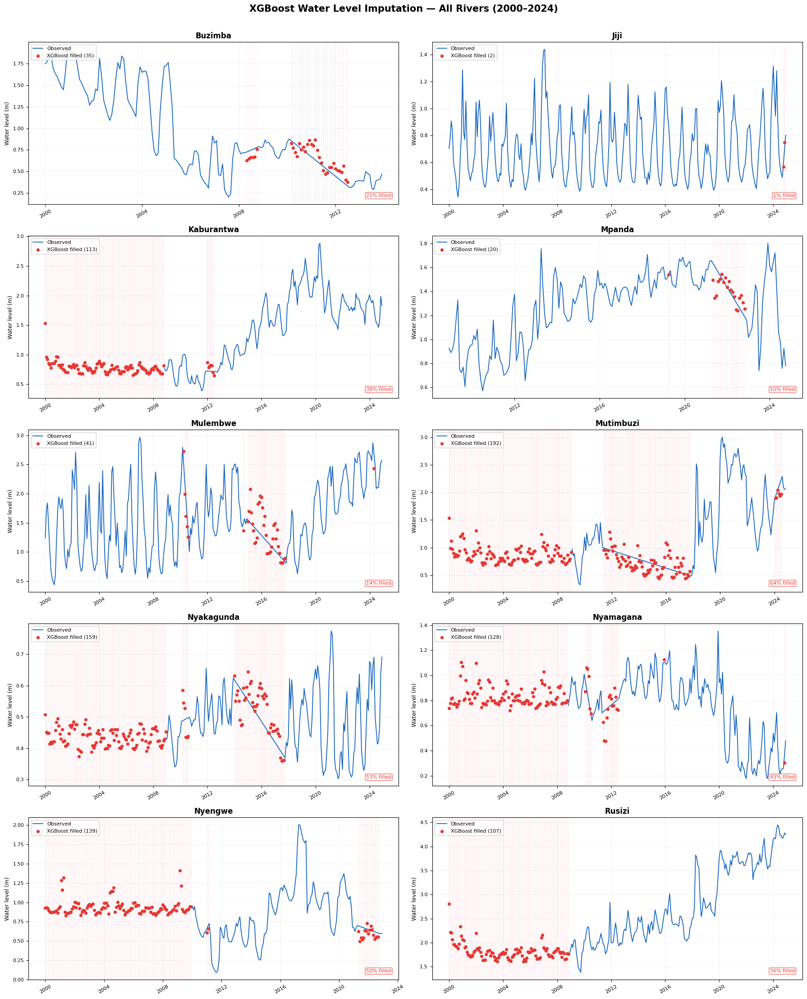

✓ Plot saved → xgboost_all_rivers.png


In [10]:
# ============================================================
# XGBoost WATER LEVEL IMPUTATION — ALL RIVERS OVERVIEW PLOT
# Blue line  = original observed values
# Red dots   = months filled by XGBoost
# Light red shading = filled gap regions
# ============================================================

import matplotlib.dates as mdates
import matplotlib.pyplot as plt

fig, axes = plt.subplots(5, 2, figsize=(18, 22))
axes = axes.flatten()

river_list = sorted(rivers_imputed[RIVER_COL].dropna().unique())

for ax, river_name in zip(axes, river_list):

    sub = rivers_imputed[
        (rivers_imputed[RIVER_COL] == river_name) &
        (rivers_imputed.index.year >= START_YEAR)
    ].copy().sort_index()

    # ── Blue line: observed values ────────────────────────────────────────────
    obs = sub[sub['water_level_XGBoost_method'] == 'observed']
    ax.plot(
        obs.index, obs['water_level_XGBoost_imputed'],
        color='#1565C0', linewidth=1.3,
        label='Observed', zorder=3
    )

    # ── Red dots: XGBoost-filled values ──────────────────────────────────────
    filled = sub[sub['water_level_XGBoost_method'] == 'XGBoost']
    if len(filled) > 0:
        ax.scatter(
            filled.index, filled['water_level_XGBoost_imputed'],
            color='#E53935', s=18, zorder=4,
            label=f'XGBoost filled ({len(filled)})'
        )
        # Light red vertical shading per filled month
        for idx in filled.index:
            ax.axvline(idx, color='#FFCDD2', linewidth=0.6, alpha=0.5, zorder=1)

    # ── Labels and formatting ─────────────────────────────────────────────────
    ax.set_title(river_name, fontsize=12, fontweight='bold', pad=6)
    ax.set_ylabel('Water level (m)', fontsize=9)
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y'))
    ax.xaxis.set_major_locator(mdates.YearLocator(4))
    ax.tick_params(axis='x', rotation=30, labelsize=8)
    ax.tick_params(axis='y', labelsize=8)
    ax.legend(fontsize=8, loc='upper left')
    ax.grid(True, alpha=0.25, linewidth=0.5)

    # ── Filled % badge in bottom-right corner ─────────────────────────────────
    total   = len(sub)
    n_fill  = len(filled)
    pct     = n_fill / total * 100 if total > 0 else 0
    ax.text(
        0.98, 0.04, f'{pct:.0f}% filled',
        transform=ax.transAxes, ha='right', va='bottom',
        fontsize=8, color='#E53935',
        bbox=dict(boxstyle='round,pad=0.2', fc='white', ec='#E53935', alpha=0.7)
    )

fig.suptitle(
    'XGBoost Water Level Imputation — All Rivers (2000–2024)',
    fontsize=15, fontweight='bold', y=1.005
)

plt.tight_layout()
plt.savefig('xgboost_all_rivers.png', dpi=150, bbox_inches='tight')
plt.show()
print('✓ Plot saved → xgboost_all_rivers.png')
